#### Multi-class Dog Breed Classification

In [ ]:
import pandas as pd
import tensorflow as tf
import tensorflow_hub as hub
import numpy as np
from IPython.display import Image
import matplotlib.pyplot as plt
from matplotlib.pyplot import imread
import os
from sklearn.model_selection import train_test_split
import datetime

In [2]:
tf.__version__

'2.18.1'

In [2]:
# Check for GPU availability
print("GPU available" if tf.config.list_physical_devices("GPU") else "GPU not available")

GPU not available


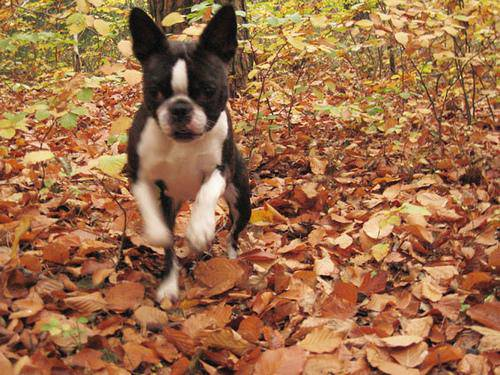

In [3]:
# Checking one training sample
Image("train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [5]:
# Checking training labels
train_labels = pd.read_csv('labels.csv')

In [6]:
train_labels.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


In [7]:
train_labels[train_labels['breed'] == "scottish_deerhound"].count()

id       126
breed    126
dtype: int64

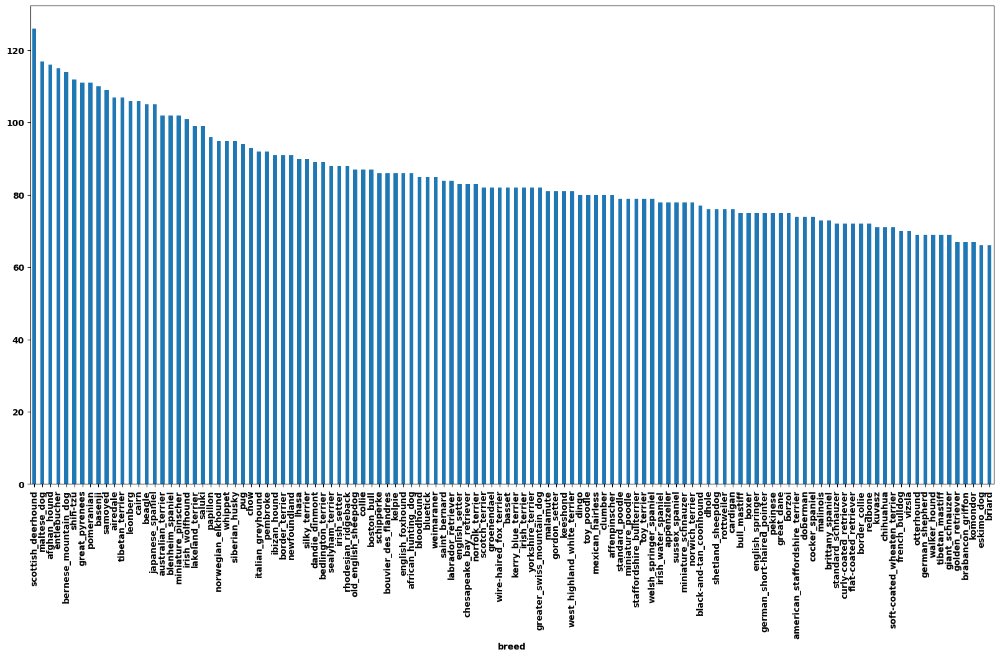

In [8]:
train_labels['breed'].value_counts().plot.bar(figsize=(20,10))
plt.show()

In [9]:
# Minimum requirements for labels per class is atleast 10 images, better around 100
# this dataset has between 66 to 126 = good distribution of the labels
print(f"Median value: {train_labels['breed'].value_counts().median()}")
print(f"Max value: {train_labels['breed'].value_counts().max()}")
print(f"Min value: {train_labels['breed'].value_counts().min()}")

Median value: 82.0
Max value: 126
Min value: 66


In [10]:
train_labels

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
...,...,...
10217,ffd25009d635cfd16e793503ac5edef0,borzoi
10218,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont
10219,ffe2ca6c940cddfee68fa3cc6c63213f,airedale
10220,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher


In [11]:
# Getting images and their labels
filenames = ["train/" + fname + '.jpg' for fname in train_labels['id']]
print(len(filenames))
print(filenames[:10])

10222
['train/000bec180eb18c7604dcecc8fe0dba07.jpg', 'train/001513dfcb2ffafc82cccf4d8bbaba97.jpg', 'train/001cdf01b096e06d78e9e5112d419397.jpg', 'train/00214f311d5d2247d5dfe4fe24b2303d.jpg', 'train/0021f9ceb3235effd7fcde7f7538ed62.jpg', 'train/002211c81b498ef88e1b40b9abf84e1d.jpg', 'train/00290d3e1fdd27226ba27a8ce248ce85.jpg', 'train/002a283a315af96eaea0e28e7163b21b.jpg', 'train/003df8b8a8b05244b1d920bb6cf451f9.jpg', 'train/0042188c895a2f14ef64a918ed9c7b64.jpg']


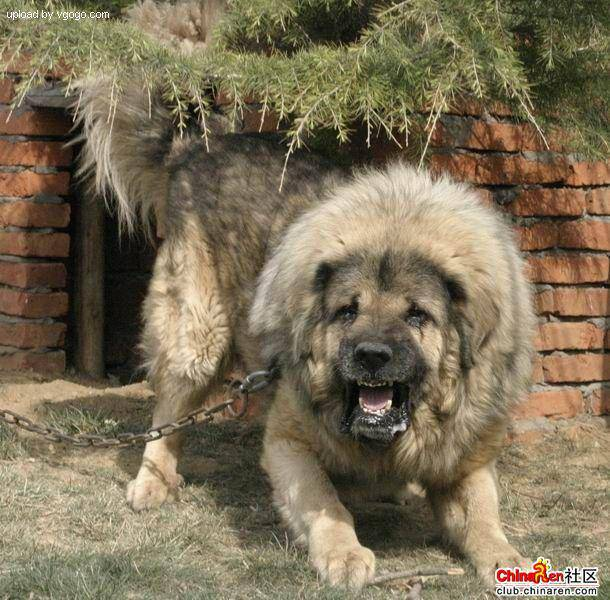

In [12]:
Image(filenames[9000])

In [13]:
train_labels['breed'][9000]

'tibetan_mastiff'

In [14]:
if len(os.listdir("train")) == len(filenames):
  print("All images are present")
else:
  print("Not all images are present")

All images are present


In [15]:
train_labels['breed']

0                     boston_bull
1                           dingo
2                        pekinese
3                        bluetick
4                golden_retriever
                   ...           
10217                      borzoi
10218              dandie_dinmont
10219                    airedale
10220          miniature_pinscher
10221    chesapeake_bay_retriever
Name: breed, Length: 10222, dtype: object

In [16]:
labels = train_labels['breed'].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [17]:
# Checking the unique labels, so they can be turned into numeric values
unique_breeds = np.unique(labels)
print(len(unique_breeds))
unique_breeds

120


array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# Turning a every label into an array of booleans
boolean_labels = [label == unique_breeds for label in labels]
print(len(boolean_labels))
boolean_labels

In [19]:
# Turning boolean array into integers
print(labels[0])
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int))


boston_bull
(array([19], dtype=int64),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [20]:
print(labels[5])
print(boolean_labels[5].astype(int))

bedlington_terrier
[0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [21]:
# Setup X & y variables
X = filenames
y = boolean_labels


In [ ]:
# Goint to start off experimenting with ~1000 images and increase as needed
NUM_IMAGES = 1000

In [23]:
# Creating validation set
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42, stratify=y[:NUM_IMAGES])

In [24]:
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [26]:
# Convert an image to NumPy
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  5

In [28]:
len(image[256])

350

In [29]:
# Converting images into Tensors
IMG_SIZE = 224 # making images 224x224 because the model im going to use is trained on images that size

# Create func for preprocessing images (normalizing an image)
def preprocess_image(image_path, img_size=224):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # read image
  image = tf.io.read_file(image_path)

  # turn into numerical Tensor with 3 color channels
  image = tf.image.decode_jpeg(image, channels=3)

  # conver the color channel values from 0-255 to 0-1 values (normalization of the image)
  image = tf.image.convert_image_dtype(image, tf.float32)

  # resize the image to the desired value (224, 224)
  image = tf.image.resize(image, size=[img_size, img_size])

  return image

In [ ]:
def get_image_lable(image_path, label):
  image = preprocess_image(image_path)
  return image, label


In [88]:
# Define the batch size
BATCH_SIZE = 32

# Create a funct to turn data into batches


def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """

  # If the data is a test dataset, we dont have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths
    # preprocess_image because test data has no labels
    data_batch = data.map(preprocess_image).batch(batch_size)
    return data_batch

  # If the data is a valid dataset, we dont need to shuffle it
  elif valid_data:
    print("Creating validation batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data_batch = data.map(get_image_lable).batch(batch_size)
    return data_batch
  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))

    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))
    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_lable)

    # Turn the training data into batches
    data_batch = data.batch(batch_size)
    return data_batch

In [32]:
# Creating training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation batches...


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
# Visualizing the data
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10,10))

  # Loop through 25
  for i in range(25):
    ax = plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.axis("off")
    plt.title(unique_breeds[labels[i].argmax()])


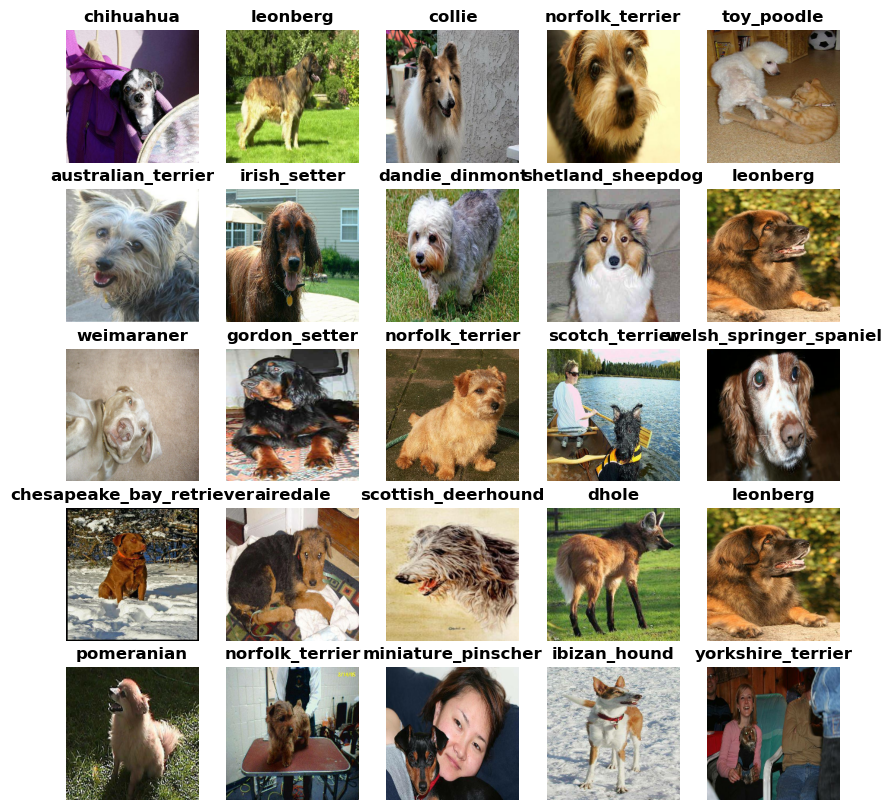

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

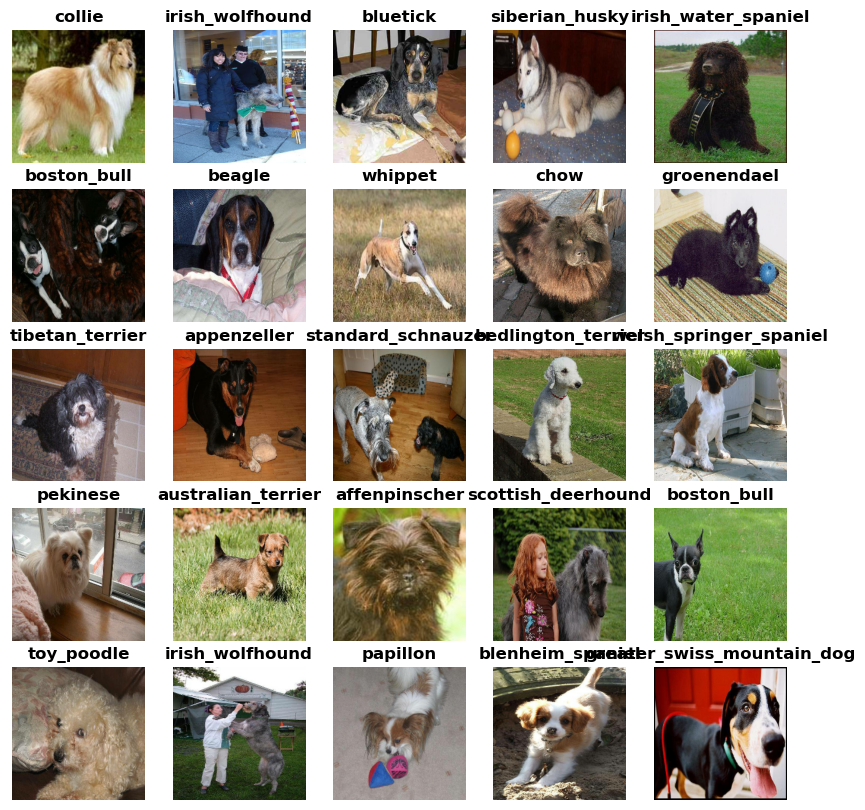

In [ ]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

In [37]:
# Building a mode

## Setup the input/output shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# number of unique dog breeds
OUTPUT_SHAPE = len(unique_breeds)

## Setup model URL from TF-Hub
MODEL_URL = "https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1"

In [38]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", model_url)

  # Setup the model layers
  model = tf.keras.Sequential([
    tf.keras.Input(shape=(224, 224, 3)),
    tf.keras.layers.Lambda(hub.KerasLayer(model_url, trainable=False)),
    # Layer 2 (output layer)
    tf.keras.layers.Dense(units=output_shape, activation="softmax")
  ])

  # Compile the mode
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(input_shape)

  return model

In [ ]:
model = create_model()
model.summary()

In [ ]:
hub_layer = hub.KerasLayer(MODEL_URL, trainable=True)
print("Trainable variables inside the Lambda / Hub layer:")

total_params = sum(tf.size(v).numpy() for v in hub_layer.trainable_variables)
print(f"Total trainable parameters in Hub layer: {total_params:,}")


Trainable variables inside the Lambda / Hub layer:
Total trainable parameters in Hub layer: 5,388,457


In [ ]:
# Callbacks

## Load TensorBoard
%load_ext tensorboard

In [ ]:
# Building TensorBoard callback
def create_tensorboard_callback():
  log_dir = os.path.join("logs", datetime.datetime.now().strftime("%Y-%m-%d-%H-%M-%S"))
  tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
  print(f"Saving TensorBoard log files to: {log_dir}")
  return tensorboard_callback

In [43]:
# Early stopping callback, preventing overfitting, when the eval. metric stops improving.
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

In [44]:
# Training a model (on subset of data, 1000 images, testing the waters before feeding the whole data)
EPOCHS = 100

In [ ]:
def train_model():
  """
  Trains a given model and returns the trained version
  """

  # create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks
  model.fit(x=train_data,
            epochs=EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model


In [47]:
# Fit the model to the data
model = train_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Saving TensorBoard log files to: logs\2025-11-14-14-52-46
Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 11s 310ms/step - accuracy: 0.1013 - loss: 4.6919 - val_accuracy: 0.2850 - val_loss: 3.2438
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 278ms/step - accuracy: 0.6762 - loss: 1.6621 - val_accuracy: 0.5500 - val_loss: 1.9263
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 275ms/step - accuracy: 0.9262 - loss: 0.5729 - val_accuracy: 0.6350 - val_loss: 1.4761
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 269ms/step - accuracy: 0.9887 - loss: 0.2539 - val_accuracy: 0.6700 - val_loss: 1.3081
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 270ms/step - accuracy: 0.9987 - loss: 0.1480 - val_accuracy: 0.6850 - val_loss: 1.2275
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 283ms/step - accuracy: 1.0000 - loss: 0.1014 - val_accuracy: 0.7000 - val_loss: 1.1814
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 8s 309ms/step - accuracy

>Key Note: The model is overfitting but, im training it on 800 examples and validating on 200, also i dont know what is the class distribution in the validation set, does the validation set contains all 120 labels and if it does, is the train_test_split splitted it with equal percentage (i forgot to use `stratify`, maybe i will retrain it later with `stratify`)

In [ ]:
### Checking the TensorBoard logs
%tensorboard --logdir logs

In [50]:
 # Evaluating predictions using a trained model
predictions = model.predict(val_data, verbose=1)
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 238ms/step


array([[2.2766297e-03, 8.2019455e-04, 1.4513140e-03, ..., 9.2766742e-04,
        3.9987100e-04, 1.4348776e-03],
       [1.0168547e-05, 1.9913359e-05, 4.4261337e-06, ..., 6.4679730e-06,
        5.3144002e-04, 1.6960010e-04],
       [2.7207719e-07, 4.5916008e-06, 7.9079446e-06, ..., 2.3076529e-06,
        8.4603256e-05, 3.4693291e-04],
       ...,
       [1.3698565e-03, 1.5809503e-05, 5.8505824e-04, ..., 6.3326731e-02,
        4.6335601e-05, 2.5182401e-04],
       [3.0321305e-04, 1.0551797e-03, 9.5904578e-04, ..., 1.0018741e-03,
        8.9549384e-04, 6.2555679e-05],
       [3.3698261e-03, 9.2012022e-04, 5.2048308e-06, ..., 1.8155067e-04,
        8.3673986e-05, 6.8532449e-06]], dtype=float32)

In [51]:
# this is what the model thinks is the right answer, the highest value in this array is what the model thinks is the breed of the 1st picture
print(predictions[0])

index = 0

print(predictions[index])
print(f"Max Value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}") # round up to approx. 1.00
print(f"Max Index: {np.argmax(predictions[index])}")
print(f"Predicted Breed/label: {unique_breeds[np.argmax(predictions[index])]}")

[2.27662968e-03 8.20194546e-04 1.45131396e-03 8.06260097e-04
 3.03465204e-04 5.60256012e-04 6.64386433e-03 9.88211948e-04
 6.59441517e-04 1.12297334e-04 5.62236935e-04 3.29965656e-03
 4.65590972e-04 4.57376795e-04 5.54998463e-04 4.13812639e-04
 1.03115821e-02 1.42779248e-03 2.04481976e-03 3.22008447e-04
 2.97352235e-04 3.66532011e-04 4.38984571e-04 1.07794702e-02
 3.27703333e-03 1.03225268e-03 1.08519860e-04 8.03743955e-04
 3.92665766e-04 6.13188429e-04 9.30362660e-03 1.29100867e-03
 3.26755573e-04 3.84420425e-01 8.80461943e-04 1.44824793e-04
 4.29752469e-03 8.81393673e-04 4.28140018e-04 2.19539227e-03
 2.81834655e-04 2.00667128e-04 4.46218764e-04 1.12191704e-03
 8.98830302e-04 9.76458614e-05 2.36686296e-03 4.06945066e-04
 2.96216982e-04 9.94455349e-03 1.70443469e-04 6.70336478e-04
 2.55096401e-03 1.68997751e-04 6.59771496e-03 2.17726440e-04
 1.96374208e-03 4.76488523e-04 3.56020682e-05 3.95180564e-03
 3.86389904e-04 1.95252069e-03 2.27346029e-02 3.68449430e-04
 1.26187442e-04 3.988354

In [52]:
# Turn predictions probabilities into their respective label
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

In [53]:
# Unbatch the validation data, so i can extract the real images out of it
images_ = []
labels_ = []

for image, lable in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(lable)

In [54]:
def unbatch_data(data):
  images = []
  labels = []

  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

In [55]:
val_images, val_labels = unbatch_data(val_data)
val_images[0], val_labels[0]

(array([[[0.38427874, 0.38531166, 0.1892332 ],
         [0.29293594, 0.30232844, 0.10160191],
         [0.24972716, 0.271821  , 0.06139556],
         ...,
         [0.05923324, 0.06315481, 0.04366802],
         [0.0879981 , 0.09191967, 0.07231183],
         [0.12732796, 0.13124953, 0.11164168]],
 
        [[0.35044384, 0.35147676, 0.15539831],
         [0.25862223, 0.26801473, 0.06728818],
         [0.21751153, 0.23960537, 0.02917993],
         ...,
         [0.01126116, 0.01518272, 0.        ],
         [0.03586721, 0.03978878, 0.02105251],
         [0.07480434, 0.0787259 , 0.05911806]],
 
        [[0.32640934, 0.32744223, 0.13136381],
         [0.23129831, 0.24069081, 0.04032739],
         [0.18680725, 0.20890109, 0.        ],
         ...,
         [0.        , 0.00392157, 0.        ],
         [0.01645654, 0.02037811, 0.00696808],
         [0.05364818, 0.05756975, 0.0379619 ]],
 
        ...,
 
        [[0.70026386, 0.79046   , 0.4453619 ],
         [0.6401123 , 0.73030835, 0.38521

In [56]:
get_pred_label(val_labels[0])

'affenpinscher'

In [57]:
def plot_pred(prediction_probabilities, image, labels, n=0):
  """
  View the prediction, ground truth label and image for sample n.
  """

  pred_prob, true_label, image = prediction_probabilities[n], labels[n], image[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.imshow(image)
  plt.title(f"Prediction: {pred_label} | True Label: {true_label} | Confidence: {np.max(pred_prob)*100:.2f}%", color=color)
  plt.axis(False)

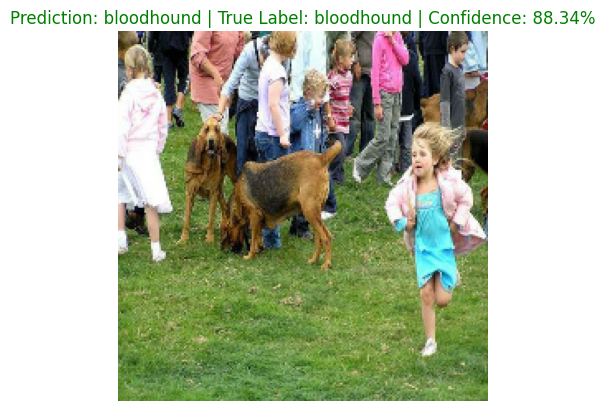

In [62]:
# Hard image for predictions (correct)
plot_pred(prediction_probabilities=predictions, image=val_images, labels=val_labels, n=76)

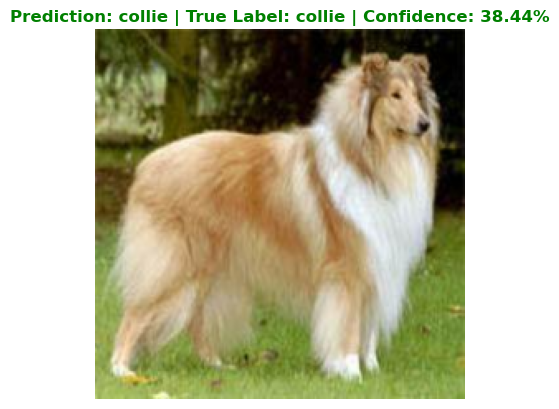

In [58]:
# Easier image for prediction (correct)
plot_pred(prediction_probabilities=predictions, image=val_images, labels=val_labels)

In [59]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  pred_label = get_pred_label(pred_prob)
  top_10_pred_indices = pred_prob.argsort()[-10:][::-1]
  top_10_pred_values = pred_prob[top_10_pred_indices]
  top_10_pred_labels = unique_breeds[top_10_pred_indices]

  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), top_10_pred_values, color='grey')
  plt.xticks(np.arange(len(top_10_pred_labels)), labels=top_10_pred_labels, rotation=90)

  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass

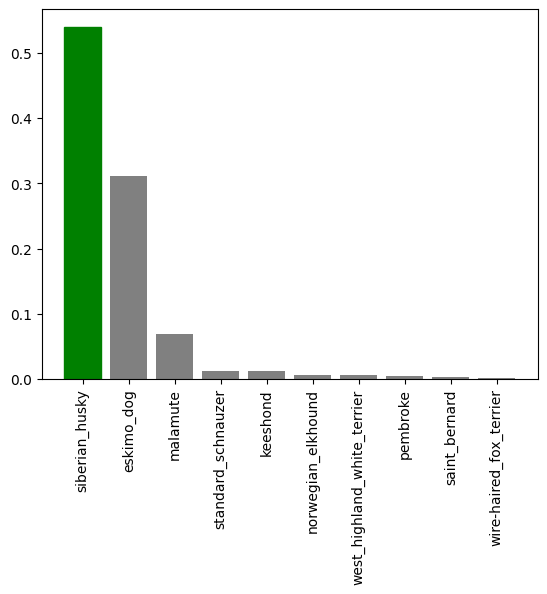

In [65]:
plot_pred_conf(predictions, val_labels, n=3)

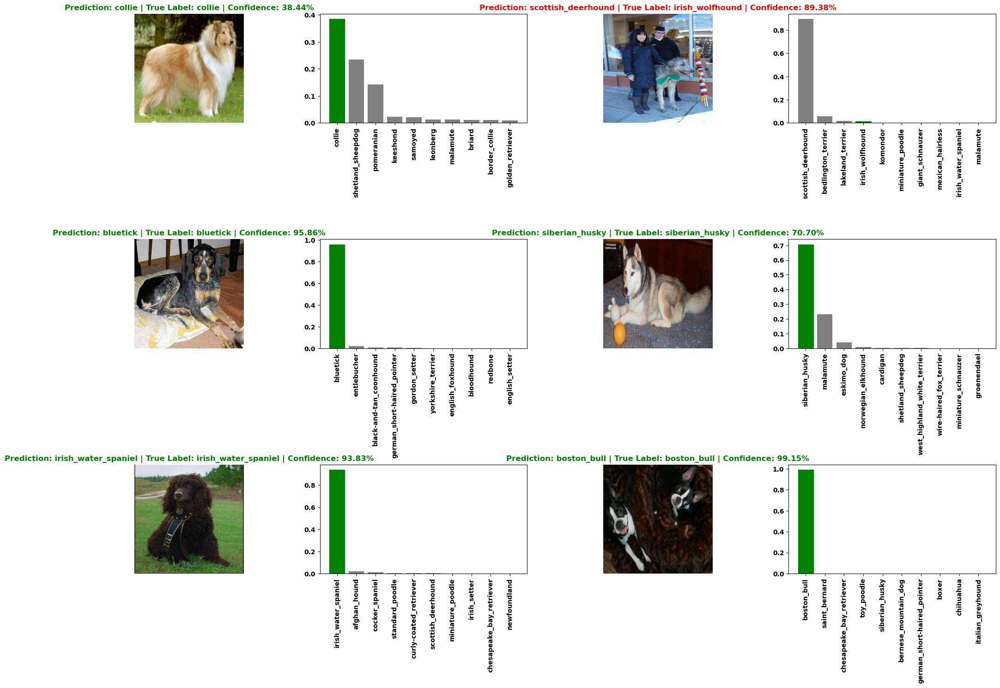

In [60]:
# Checking out a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(predictions, val_images, val_labels, i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(predictions, val_labels, i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [73]:
# Saving and reloading a trained model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str) for clarity.
  """
  model_dir = os.path.join("models", datetime.datetime.now().strftime("%Y-%m-%d-%H-%M-%S"))
  model_path = model_dir + "-" + suffix + ".keras"
  print(f"Saving model to: {model_path}")
  model.save(model_path)
  return model_path

In [74]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path, custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [75]:
save_model(model, suffix='1000-images-mobilenetv2')

Saving model to: models\2025-11-14-15-05-04-1000-images-mobilenetv2.keras


'models\\2025-11-14-15-05-04-1000-images-mobilenetv2.keras'

In [76]:
loaded_1000_images_model = load_model("models/2025-11-14-15-05-04-1000-images-mobilenetv2.keras")

Loading saved model from: models/2025-11-14-15-05-04-1000-images-mobilenetv2.keras


In [77]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 186ms/step - accuracy: 0.7400 - loss: 1.0318


[1.0318427085876465, 0.7400000095367432]

In [78]:
# Evaluate the loaded model
loaded_1000_images_model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 182ms/step - accuracy: 0.7400 - loss: 1.0318


[1.0318427085876465, 0.7400000095367432]

In [79]:
# Training a model on the full data (10000 images)

## Create data batch
full_data = create_data_batches(X, y)

full_data

Creating training data batches...


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [80]:
## Create a model
full_model = create_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1


In [82]:
## Create full data model callback
full_model_tensorboard = create_tensorboard_callback()

## No validation set so the measurement is `accuracy`
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

Saving TensorBoard log files to: logs\2025-11-14-15-15-29


In [83]:
## Fit the full model to the full data
full_model.fit(x=full_data, epochs=EPOCHS, callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 76s 230ms/step - accuracy: 0.6700 - loss: 1.3384
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 69s 215ms/step - accuracy: 0.8881 - loss: 0.3930
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 68s 211ms/step - accuracy: 0.9358 - loss: 0.2346
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 68s 211ms/step - accuracy: 0.9621 - loss: 0.1516
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 68s 211ms/step - accuracy: 0.9781 - loss: 0.1050
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 68s 211ms/step - accuracy: 0.9881 - loss: 0.0753
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 70s 220ms/step - accuracy: 0.9922 - loss: 0.0572
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 77s 240ms/step - accuracy: 0.9944 - loss: 0.0456
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 73s 227ms/step - accuracy: 0.9966 - loss: 0.0364
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 73s 228ms/step - accuracy: 0.9975 - loss: 0.0306
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 72s 225ms/step - accuracy: 0.9977 - loss: 0.0262
Epoch 12

In [84]:
save_model(full_model, suffix="full-image-set-mobilenetv2")

Saving model to: models\2025-11-14-17-07-17-full-image-set-mobilenetv2.keras


'models\\2025-11-14-17-07-17-full-image-set-mobilenetv2.keras'

In [87]:
# Making prediction on test dataset

## Preprocessing the data
test_path = 'test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:5]

['test/000621fb3cbb32d8935728e48679680e.jpg',
 'test/00102ee9d8eb90812350685311fe5890.jpg',
 'test/0012a730dfa437f5f3613fb75efcd4ce.jpg',
 'test/001510bc8570bbeee98c8d80c8a95ec1.jpg',
 'test/001a5f3114548acdefa3d4da05474c2e.jpg']

In [93]:
len(test_filenames)

10357

In [89]:
## Create test data batches
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [91]:
## Make predictions on test data batch using full model
test_predictions = full_model.predict(test_data, verbose=1)

324/324 ━━━━━━━━━━━━━━━━━━━━ 74s 229ms/step


In [97]:
## Save predictions for access later
np.savetxt("predictions", test_predictions, delimiter=",")

In [99]:
test_predictions = np.loadtxt('predictions', delimiter=',')

In [103]:
## Preparing test dataset predictions for Kaggle
preds_df = pd.DataFrame(columns=['id'] + list(unique_breeds))
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [107]:
## Append test image ID`s to predictions DF
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_ids[:5]

['000621fb3cbb32d8935728e48679680e',
 '00102ee9d8eb90812350685311fe5890',
 '0012a730dfa437f5f3613fb75efcd4ce',
 '001510bc8570bbeee98c8d80c8a95ec1',
 '001a5f3114548acdefa3d4da05474c2e']

In [108]:
preds_df['id'] = test_ids

In [ ]:
## Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions

In [114]:
preds_df.head(10)

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,4.396070e-12,1.508632e-12,5.975708e-16,2.124052e-14,8.229633e-14,3.336479e-12,1.610396e-17,1.334352e-13,5.742164e-14,...,3.470400e-13,4.489760e-15,1.415204e-14,3.453254e-16,1.510871e-14,1.711347e-13,3.195197e-14,4.358479e-14,2.768775e-10,5.611025e-12
1,00102ee9d8eb90812350685311fe5890,4.923921e-06,1.783263e-06,6.805554e-08,1.341036e-09,1.458543e-06,6.161133e-09,8.004665e-07,1.188153e-07,5.216743e-09,...,8.687994e-09,2.054734e-06,5.592406e-09,4.101310e-06,5.511464e-08,2.308415e-07,5.277726e-04,2.312676e-11,4.226275e-07,8.180610e-10
2,0012a730dfa437f5f3613fb75efcd4ce,1.308578e-11,1.101172e-06,2.944477e-09,1.487961e-11,5.831154e-11,1.237028e-08,6.755254e-12,2.371055e-12,7.367084e-10,...,1.316327e-12,1.173057e-11,5.661121e-08,1.491431e-06,1.547219e-08,9.937943e-09,9.814369e-13,3.751334e-08,9.133920e-11,5.563550e-12
3,001510bc8570bbeee98c8d80c8a95ec1,3.070580e-06,1.875377e-07,2.379337e-07,2.800576e-06,3.187520e-05,6.064442e-06,1.216011e-11,1.525675e-09,7.825099e-09,...,1.147454e-07,2.992578e-10,4.992116e-06,1.391238e-09,1.791950e-06,4.881731e-10,1.399879e-16,5.675824e-03,5.439315e-12,2.061044e-07
4,001a5f3114548acdefa3d4da05474c2e,3.586748e-05,7.246705e-06,4.362090e-09,1.829626e-10,2.542903e-10,4.908062e-12,6.842813e-11,2.036896e-09,7.191002e-10,...,2.431665e-08,8.394486e-11,1.440283e-11,6.407281e-12,5.046356e-10,5.241976e-11,3.380221e-12,1.727739e-09,9.318454e-11,2.373126e-08
5,00225dcd3e4d2410dd53239f95c0352f,2.637672e-13,1.462708e-01,1.165274e-10,1.131240e-05,1.432098e-09,8.809180e-10,2.362759e-11,2.092073e-06,8.078482e-11,...,7.614444e-01,3.993464e-13,9.059409e-08,2.280408e-09,1.404221e-07,2.861449e-11,1.181552e-12,2.643756e-07,1.362173e-04,1.266510e-09
6,002c2a3117c2193b4d26400ce431eebd,1.740020e-11,1.303765e-10,2.326479e-10,2.714992e-09,3.197784e-09,6.078363e-12,9.999796e-01,1.692303e-09,1.127428e-11,...,1.320396e-11,1.213636e-08,1.873951e-10,7.108631e-12,2.483357e-11,2.653299e-12,1.304024e-09,9.287003e-14,2.677627e-07,8.065444e-06
7,002c58d413a521ae8d1a5daeb35fc803,1.475734e-09,6.398271e-11,6.422456e-11,8.576711e-14,3.500179e-10,4.368644e-12,3.402282e-10,1.356051e-11,8.433142e-12,...,5.184434e-11,1.290129e-10,1.057368e-10,1.462879e-10,1.998483e-12,1.968167e-12,4.016515e-07,1.050404e-12,2.989990e-12,1.284927e-11
8,002f80396f1e3db687c5932d7978b196,3.698945e-12,5.975661e-11,1.086821e-12,7.160413e-09,1.466184e-12,1.127352e-13,7.528512e-15,2.123666e-14,1.422586e-14,...,1.311213e-13,3.019863e-14,2.805975e-12,4.202214e-11,4.197059e-09,2.524327e-13,2.412477e-13,1.015831e-07,1.983272e-10,3.283490e-12
9,0036c6bcec6031be9e62a257b1c3c442,1.411242e-09,4.625266e-12,3.802993e-12,4.443665e-12,1.930826e-10,2.845201e-14,3.215308e-11,3.767665e-16,7.238836e-10,...,5.672633e-10,4.931391e-11,1.662204e-07,4.136198e-11,1.897906e-07,5.439033e-12,1.117919e-12,1.038099e-13,4.440242e-12,1.119979e-08


In [117]:
preds_df.to_csv("full_model_predictions_kaggle_submission", index=False)

In [120]:
full_model.evaluate(full_data)

320/320 ━━━━━━━━━━━━━━━━━━━━ 71s 221ms/step - accuracy: 0.9994 - loss: 0.0061


[0.006132850889116526, 0.999413013458252]

In [137]:
## Test on custom images
custom_path = 'custom-images/'
custom_images_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [138]:
custom_data = create_data_batches(custom_images_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [141]:
## Make prediction
custom_preds = full_model.predict(custom_data)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


In [142]:
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['pembroke']

In [148]:
np.where(unique_breeds == 'pembroke')
unique_breeds[86]

'pembroke'

In [159]:
train_labels = pd.read_csv("labels.csv")

In [208]:
corgis = train_labels[train_labels['breed'] == 'pembroke']
corgis

,id,breed
327,07e12e8064b6b17a94608ba5fd78a72e,pembroke
552,0d8d386390ba269dd4e475c20b91e8f9,pembroke
647,0fc4930f411a11df34283f349d891654,pembroke
664,102fe645c59f482cbc771c01cfff3ff9,pembroke
885,1586326d52312228c20c3599feb72d7a,pembroke
...,...,...
9859,f8068ff990794cc54cd2d647387ecf6d,pembroke
9930,f9900b44f49e5075c5b3fb589d1aae4b,pembroke
10000,fad30cde8ff696cba83278a55a8de87b,pembroke
10074,fc6df38f35361d2630568b993a596008,pembroke


In [ ]:
indexes = train_labels.index[train_labels['breed'] == 'pembroke'].tolist()
indexes

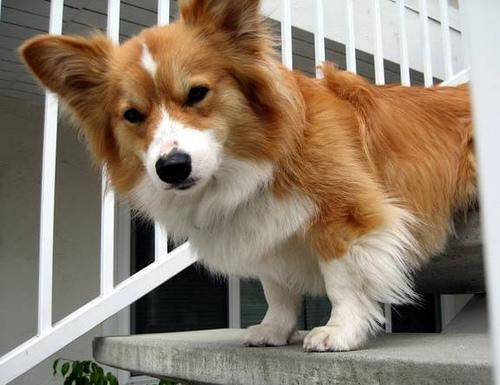

In [206]:
Image("train/" + str(corgis['id'].iloc[32]) + '.jpg')